In [ ]:
#!wget https://www.kaggle.com/datasets/ryusonoda/u-s-university-dataset-from-2001-to-2022/download?datasetVersionNumber=2

# Полезные ссылки

In [ ]:
# https://colab.research.google.com/notebooks/markdown_guide.ipynb
# https://github.com/Tanu-N-Prabhu/Python/blob/master/Cheat_sheet_for_Google_Colab.ipynb

# Начальная загрузка и распаковка данных

Красткое описание <br>
* я больше заинтересован в обработке биометрических данных, отпечатков пальцев и др, нло пока потренируюсь на "кошках"
* в качестве датасета я выбрал датасет с Kaggle по статистике обучающихмся в университетах, что в дальнейшем можно перелдожить на статистку в ИТМО

In [1]:
!unzip /content/US_University_datasets.zip

Archive:  /content/US_University_datasets.zip
  inflating: college_data.csv        


In [ ]:
#!unzip /content/archive.zip

SyntaxError: invalid character '№' (U+2116) (<ipython-input-10-2ea9650e1eca>, line 1)

In [2]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.cbook import boxplot_stats


from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA

#Описание данных

| Название столбца | Значение | По-русски |
| ----------------| :----------------| :------------------------|
| UNITID | Unit ID for institution| Идентификатор |
| INSTNM | Institution name| Название  |
| CITY | City of the University located at| ГОРОД |
| STABBR | State postcode | индекс Штата |
| ZIP  | ZIP code | индекс |
| REGION  | Region (IPEDS) | РЕГИОН |
| PREDDEG  | Predominant undergraduate degree awardedCarnegie <br>Classification -- basic| Преобладающая степень бакалавра |
| LOCALE  | Locale of institution| РЕГИОН  |
| LATITUDE  | Latitude| ШИРОТА  |
| LONGITUDE  | Longitude| ДОЛГОТА |
| CCBASIC  | Carnegie Classification -- basic| Классификация Карнеги -- базовая |
| CCUGPROF  | Carnegie Classification -- undergraduate profile|  Классификация Карнеги - профиль |
| CCSIZSET  | Carnegie Classification -- size and setting|  Классификация Карнеги - размер |
| ADM_RATE_ALL  | Admission rate| Коэффициент приема |
| PPTUG_EF  | Share of undergraduate, degree-/certificate-seeking <br>students who are part-time| Доля студентов бакалавриата, <br> соискателей степени <br>  которые работают неполный рабочий день |
| SAT_AVG_ALL  | Average SAT score| средний балл |
| COSTT4_A  | The average annual total cost of attendance (CostT4_A, CostT4_P), <br> including tuition and fees, books and supplies, and living expenses,<br> minus the average grant/scholarship aid. It is calculated for all full-time, <br>first-time, degree/certificate-seeking undergraduates who receive <br>Title IV aid| Среднегодовая общая стоимость посещения |
| CONTROL |  Control of institution (IPEDS)| КОНТРОЛЬ |
| TUITIONFEE_IN  | In-state tuition and fees| Плата за обучение в штате и сборы за обучение |
| TUITIONFEE_OUT  | Out-state tuition and fees| Плата за обучение за пределами штата и сборы за обучение за пределами штата |
| MEDIAN_HH_INC MN_EARN_WNE_INDEP0_P10  | Median household income| Средний доход домохозяйства |
| MN_EARN_WNE_INDEP1_P10  | Mean household income| Средний доход домохозяйства |
| UGDS_WHITE  | Total share of enrollment of undergraduate degree-seeking <br>students who are white|  Общая доля белых студентов |
| UGDS_BLACK  | Total share of enrollment of undergraduate degree-seeking <br>students who are black| Общая доля чернокожих студентов |
| UGDS_HISP  | Total share of enrollment of undergraduate degree-seeking <br>students who are Hispanic| Общая доля испаноязычных|
| UGDS_ASIAN  | Total share of enrollment of undergraduate degree-seeking <br>students who are Asian| Общая доля азиатов |
| UGDS_AIAN  | Total share of enrollment of undergraduate degree-seeking <br>students who are American Indian/Alaska Native| Общая доля туземцев |
| UGDS_NHPI  | Total share of enrollment of undergraduate degree-seeking <br>students who are Native Hawaiian/Pacific Islander| Общая доля гаитян|
| UGDS_2MOR  | Total share of enrollment of undergraduate degree-seeking <br>students who are two or more races|  Общая доля 2 и более рас |
| UGDS_NRA  | Total share of enrollment of undergraduate degree-seeking <br>students who are non-resident aliens| Общая доля иностранцев |
| UGDS_UNKN  | Total share of enrollment of undergraduate degree-seeking <br>students whose race is unknown| Общая доля с неизвестным происхождением|
| year  | Year| | Год |


# И снова обработка данных

In [3]:
df = pd.read_csv("/content/college_data.csv", index_col="UNITID")
df.head(5)


,INSTNM,CITY,STABBR,ZIP,REGION,PREDDEG,LOCALE,LATITUDE,LONGITUDE,CCBASIC,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
UNITID,,,,,,,,,,,,,,,,,,,,,
100654,Alabama A & M University,Normal,AL,35762,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0402,0.0017,2001
100663,University of Alabama at Birmingham,Birmingham,AL,35294-0110,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0330,0.0255,2001
100706,University of Alabama in Huntsville,Huntsville,AL,35899,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0396,0.0000,2001
100751,The University of Alabama,Tuscaloosa,AL,35487-0100,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0159,0.0000,2001
100858,Auburn University,Auburn,AL,36849,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0084,0.0016,2001


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58123 entries, 100654 to 49576723
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   INSTNM                  58123 non-null  object 
 1   CITY                    58123 non-null  object 
 2   STABBR                  58123 non-null  object 
 3   ZIP                     58123 non-null  object 
 4   REGION                  58122 non-null  object 
 5   PREDDEG                 58123 non-null  object 
 6   LOCALE                  4110 non-null   float64
 7   LATITUDE                4110 non-null   float64
 8   LONGITUDE               4110 non-null   float64
 9   CCBASIC                 4110 non-null   object 
 10  CCUGPROF                4110 non-null   object 
 11  CCSIZSET                4110 non-null   object 
 12  ADM_RATE_ALL            58123 non-null  float64
 13  PPTUG_EF                55491 non-null  float64
 14  SAT_AVG_ALL             32424 

In [5]:
print(len(df.columns))

32


In [6]:
df.columns

Index(['INSTNM', 'CITY', 'STABBR', 'ZIP', 'REGION', 'PREDDEG', 'LOCALE',
       'LATITUDE', 'LONGITUDE', 'CCBASIC', 'CCUGPROF', 'CCSIZSET',
       'ADM_RATE_ALL', 'PPTUG_EF', 'SAT_AVG_ALL', 'COSTT4_A', 'CONTROL',
       'TUITIONFEE_IN', 'TUITIONFEE_OUT', 'MEDIAN_HH_INC',
       'MN_EARN_WNE_INDEP0_P10', 'MN_EARN_WNE_INDEP1_P10', 'UGDS_WHITE',
       'UGDS_BLACK', 'UGDS_HISP', 'UGDS_ASIAN', 'UGDS_AIAN', 'UGDS_NHPI',
       'UGDS_2MOR', 'UGDS_NRA', 'UGDS_UNKN', 'year'],
      dtype='object')

In [7]:
df.shape

(58123, 32)

In [8]:
df[['ADM_RATE_ALL']].mean()

ADM_RATE_ALL    0.698748
dtype: float64

In [9]:
df.dtypes

INSTNM                     object
CITY                       object
STABBR                     object
ZIP                        object
REGION                     object
PREDDEG                    object
LOCALE                    float64
LATITUDE                  float64
LONGITUDE                 float64
CCBASIC                    object
CCUGPROF                   object
CCSIZSET                   object
ADM_RATE_ALL              float64
PPTUG_EF                  float64
SAT_AVG_ALL               float64
COSTT4_A                  float64
CONTROL                    object
TUITIONFEE_IN             float64
TUITIONFEE_OUT            float64
MEDIAN_HH_INC             float64
MN_EARN_WNE_INDEP0_P10    float64
MN_EARN_WNE_INDEP1_P10    float64
UGDS_WHITE                float64
UGDS_BLACK                float64
UGDS_HISP                 float64
UGDS_ASIAN                float64
UGDS_AIAN                 float64
UGDS_NHPI                 float64
UGDS_2MOR                 float64
UGDS_NRA      

In [10]:
df.isna().sum()

INSTNM                        0
CITY                          0
STABBR                        0
ZIP                           0
REGION                        1
PREDDEG                       0
LOCALE                    54013
LATITUDE                  54013
LONGITUDE                 54013
CCBASIC                   54013
CCUGPROF                  54013
CCSIZSET                  54013
ADM_RATE_ALL                  0
PPTUG_EF                   2632
SAT_AVG_ALL               25699
COSTT4_A                  30153
CONTROL                       4
TUITIONFEE_IN              9489
TUITIONFEE_OUT            10268
MEDIAN_HH_INC             47473
MN_EARN_WNE_INDEP0_P10    45198
MN_EARN_WNE_INDEP1_P10    45035
UGDS_WHITE                23193
UGDS_BLACK                23193
UGDS_HISP                 23193
UGDS_ASIAN                23193
UGDS_AIAN                 23193
UGDS_NHPI                 23193
UGDS_2MOR                 23193
UGDS_NRA                   2510
UGDS_UNKN                  2510
year    

# попробуем выкинуть значения которые не дадут нам информации по всему датасету

In [11]:
df2 = df.copy().dropna()


In [12]:
df2.shape

(842, 32)

# Оставим только числа

In [13]:
num_cols = df2.select_dtypes(exclude='object')
num_cols.shape

(842, 22)

Осталось 22 столбца и 842 строки с числами

In [15]:
num_cols.describe()

,LOCALE,LATITUDE,LONGITUDE,ADM_RATE_ALL,PPTUG_EF,SAT_AVG_ALL,COSTT4_A,TUITIONFEE_IN,TUITIONFEE_OUT,MEDIAN_HH_INC,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
count,842.000000,842.000000,842.000000,842.000000,842.000000,842.000000,842.000000,842.000000,842.000000,842.000000,...,842.000000,842.000000,842.000000,842.000000,842.000000,842.000000,842.000000,842.000000,842.000000,842.0
mean,20.262470,38.419414,-87.989584,0.746256,0.140835,1153.781473,35943.309976,23213.447743,28812.604513,63178.513931,...,0.565748,0.138529,0.125630,0.047521,0.008713,0.002064,0.040741,0.037376,0.033677,2022.0
std,9.562299,4.899208,13.372164,0.198124,0.140963,126.026231,16649.698272,15841.249887,12792.748961,10829.676117,...,0.212519,0.176539,0.120489,0.058953,0.037298,0.004815,0.026621,0.047852,0.051204,0.0
min,11.000000,18.344193,-157.926586,0.039480,0.000000,776.000000,11506.000000,1176.000000,2644.000000,34674.560000,...,0.000600,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2022.0
25%,12.000000,35.074717,-93.619917,0.661284,0.047725,1068.000000,22430.250000,9302.250000,18690.500000,55819.765000,...,0.440100,0.046625,0.051200,0.012825,0.001300,0.000400,0.027225,0.010700,0.009800,2022.0
50%,21.000000,39.729270,-84.616090,0.789016,0.102600,1132.000000,31045.000000,16835.000000,28256.000000,62794.995000,...,0.609900,0.080200,0.087100,0.024300,0.002700,0.001000,0.037650,0.021250,0.021300,2022.0
75%,32.000000,41.740889,-78.893422,0.887159,0.179950,1220.000000,47645.500000,34793.500000,35976.500000,71169.877500,...,0.728875,0.154750,0.154075,0.055475,0.005200,0.001800,0.048375,0.046100,0.037450,2022.0
max,43.000000,64.857560,-64.972866,1.000000,0.963000,1535.000000,81531.000000,63530.000000,63530.000000,95275.150000,...,0.935000,0.984300,0.920300,0.354200,0.631600,0.082500,0.347100,0.529700,0.807000,2022.0


# А теперь посмотрим на категории

In [16]:
cat_cols = df2.select_dtypes(include='object')
cat_cols.head()

,INSTNM,CITY,STABBR,ZIP,REGION,PREDDEG,CCBASIC,CCUGPROF,CCSIZSET,CONTROL
UNITID,,,,,,,,,,
100654,Alabama A & M University,Normal,AL,35762,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,Master's Colleges & Universities: Larger Programs,"Four-year, full-time, inclusive, lower transfe...","Four-year, medium, highly residential",Public
100663,University of Alabama at Birmingham,Birmingham,AL,35294-0110,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,Doctoral Universities: Very High Research Acti...,"Four-year, medium full-time , selective, highe...","Four-year, large, primarily nonresidential",Public
100706,University of Alabama in Huntsville,Huntsville,AL,35899,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,Doctoral Universities: Very High Research Acti...,"Four-year, full-time, more selective, higher t...","Four-year, medium, primarily residential",Public
100724,Alabama State University,Montgomery,AL,36104-0271,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,Doctoral/Professional Universities,"Four-year, full-time, inclusive, lower transfe...","Four-year, medium, highly residential",Public
100751,The University of Alabama,Tuscaloosa,AL,35487-0100,"Southeast (AL, AR, FL, GA, KY, LA, MS, NC, SC,...",Predominantly bachelor's-degree granting,Doctoral Universities: Very High Research Acti...,"Four-year, full-time, selective, lower transfe...","Four-year, large, primarily residential",Public


In [17]:
cat_cols.shape

(842, 10)

# Попробуем карту

In [18]:
!pip install basemap
from mpl_toolkits.basemap import Basemap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 935.8/935.8 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 34.7 MB/s eta 0:00:00


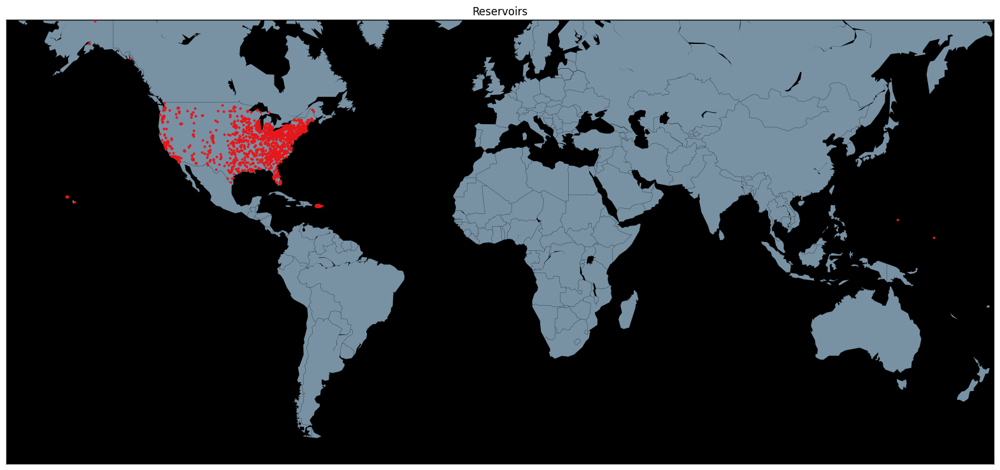

In [19]:
plt.figure(1, figsize=(20,12))

# Mercator of World
m1 = Basemap(
    projection='merc',
    llcrnrlat=-60,
    urcrnrlat=65,
    llcrnrlon=-180,
    urcrnrlon=180,
    lat_ts=0,
    resolution='c',
)

m1.fillcontinents(color='#7892A4',lake_color='#000000') # dark grey land, black lakes
m1.drawmapboundary(fill_color='#000000')                # black background
m1.drawcountries(linewidth=0.2, color="#000000")        # thin white line for country borders

# Plot the data
mxy = m1(df["LONGITUDE"].tolist(), df["LATITUDE"].tolist())
m1.scatter(mxy[0], mxy[1], s=7, c="#E6171A", lw=0, alpha=1, zorder=5)

plt.title("Reservoirs")
plt.show()

# попытаемся поиграть в метки

In [20]:
le = LabelEncoder()
for c in cat_cols.columns:
    df2[c] = le.fit_transform(cat_cols[c])
df2.head()

,INSTNM,CITY,STABBR,ZIP,REGION,PREDDEG,LOCALE,LATITUDE,LONGITUDE,CCBASIC,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
UNITID,,,,,,,,,,,,,,,,,,,,,
100654,4,402,1,341,7,1,12.0,34.783368,-86.568502,15,...,0.0184,0.8978,0.0114,0.0014,0.0027,0.0010,0.0108,0.0086,0.0479,2022
100663,628,51,1,338,7,1,12.0,33.505697,-86.799345,13,...,0.5297,0.2458,0.0669,0.0767,0.0021,0.0004,0.0483,0.0233,0.0068,2022
100706,629,251,1,342,7,1,12.0,34.724557,-86.640449,13,...,0.7196,0.0871,0.0610,0.0357,0.0080,0.0012,0.0446,0.0166,0.0261,2022
100724,5,370,1,345,7,1,12.0,32.364317,-86.295677,14,...,0.0152,0.9259,0.0129,0.0020,0.0017,0.0014,0.0132,0.0166,0.0112,2022
100751,598,552,1,340,7,1,13.0,33.211875,-87.545978,13,...,0.7676,0.1050,0.0549,0.0137,0.0037,0.0008,0.0356,0.0127,0.0060,2022


In [21]:
df2.shape

(842, 32)

In [22]:
num_cols.shape

(842, 22)

Если назначить классы по CCBASIC	Carnegie Classification -- basic	Классификация Карнеги -- базовая

In [25]:
df_class2 = df2['CCBASIC']

In [26]:
df_class2

UNITID
100654    15
100663    13
100706    13
100724    14
100751    13
          ..
488679    14
490805    15
491288     9
492801     9
495767    13
Name: CCBASIC, Length: 842, dtype: int64

## Scatterplots with targets

In [27]:

for idx, feature in enumerate(num_cols.columns):
    print(idx, feature, num_cols.columns[idx], df2[df2.columns[idx]])

0 LOCALE LOCALE UNITID
100654      4
100663    628
100706    629
100724      5
100751    598
         ... 
488679    261
490805    476
491288    766
492801    151
495767    597
Name: INSTNM, Length: 842, dtype: int64
1 LATITUDE LATITUDE UNITID
100654    402
100663     51
100706    251
100724    370
100751    552
         ... 
488679    340
490805    233
491288    359
492801    519
495767    558
Name: CITY, Length: 842, dtype: int64
2 LONGITUDE LONGITUDE UNITID
100654     1
100663     1
100706     1
100724     1
100751     1
          ..
488679    15
490805    15
491288    49
492801    24
495767    38
Name: STABBR, Length: 842, dtype: int64
3 ADM_RATE_ALL ADM_RATE_ALL UNITID
100654    341
100663    338
100706    342
100724    345
100751    340
         ... 
488679    472
490805    462
491288    522
492801    634
495767    150
Name: ZIP, Length: 842, dtype: int64
4 PPTUG_EF PPTUG_EF UNITID
100654    7
100663    7
100706    7
100724    7
100751    7
         ..
488679    1
490805    1
491

#Попробуем поискать зависимости

In [28]:
df2.shape

(842, 32)

In [29]:
num_cols.columns

Index(['LOCALE', 'LATITUDE', 'LONGITUDE', 'ADM_RATE_ALL', 'PPTUG_EF',
       'SAT_AVG_ALL', 'COSTT4_A', 'TUITIONFEE_IN', 'TUITIONFEE_OUT',
       'MEDIAN_HH_INC', 'MN_EARN_WNE_INDEP0_P10', 'MN_EARN_WNE_INDEP1_P10',
       'UGDS_WHITE', 'UGDS_BLACK', 'UGDS_HISP', 'UGDS_ASIAN', 'UGDS_AIAN',
       'UGDS_NHPI', 'UGDS_2MOR', 'UGDS_NRA', 'UGDS_UNKN', 'year'],
      dtype='object')

In [30]:
for param_name in num_cols.columns:
  print(param_name)

LOCALE
LATITUDE
LONGITUDE
ADM_RATE_ALL
PPTUG_EF
SAT_AVG_ALL
COSTT4_A
TUITIONFEE_IN
TUITIONFEE_OUT
MEDIAN_HH_INC
MN_EARN_WNE_INDEP0_P10
MN_EARN_WNE_INDEP1_P10
UGDS_WHITE
UGDS_BLACK
UGDS_HISP
UGDS_ASIAN
UGDS_AIAN
UGDS_NHPI
UGDS_2MOR
UGDS_NRA
UGDS_UNKN
year


Подбираю случайный цвет для использовыания в посторении графиков

In [31]:
color = np.random.choice(range(256), size=3)
color=str(hex(color[0]))+str(hex(color[1]))[2:4]+str(hex(color[2]))[2:4]
color='#'+color[2::]
color

'#80333a'

Люблопытно посмотерть на крату США по данным ширины и долготы

#e93de LATITUDE
#fc72f MN_EARN_WNE_INDEP1_P10
#3f5ce UGDS_HISP


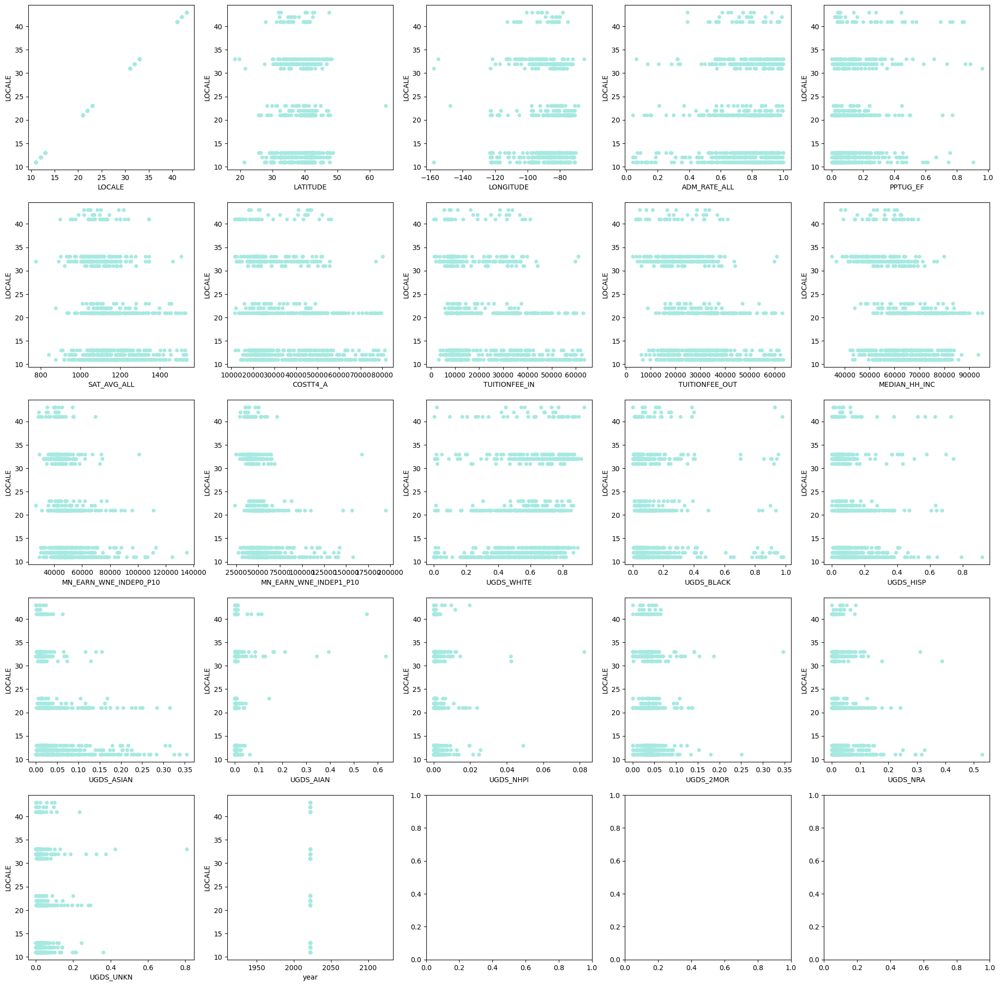

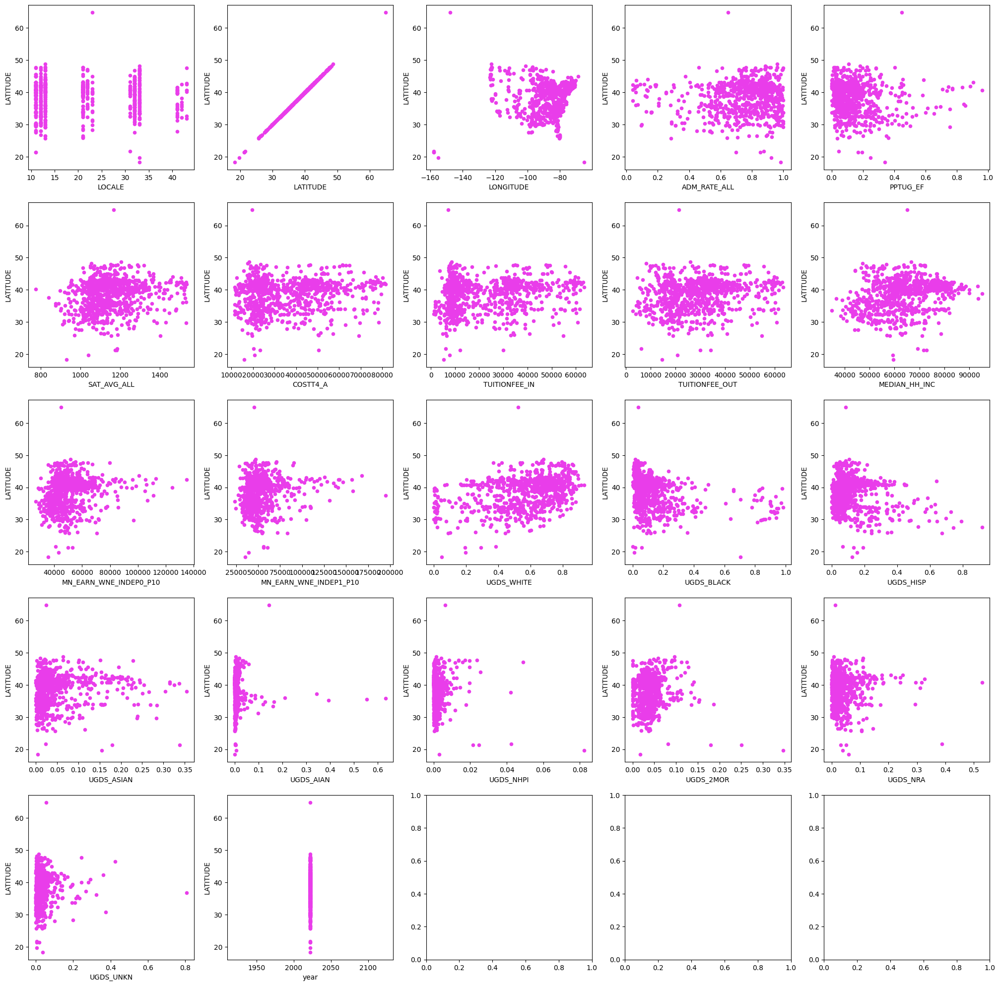

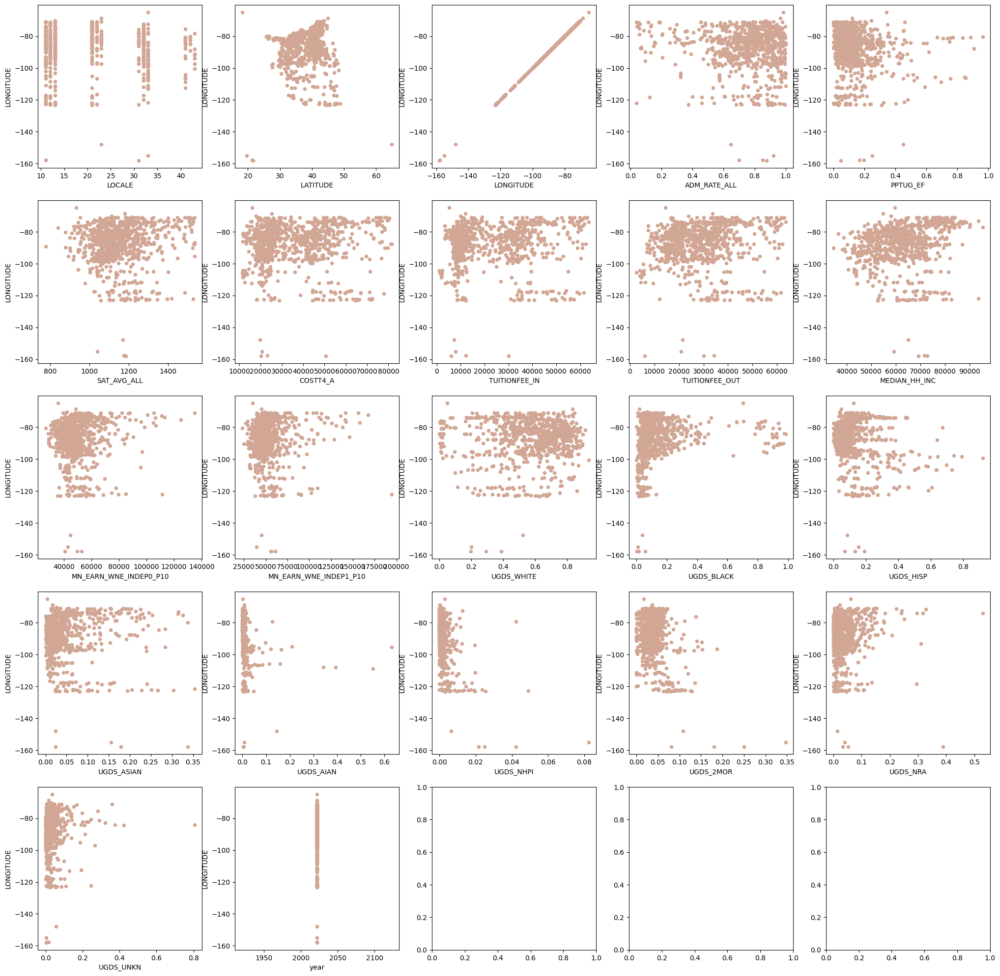

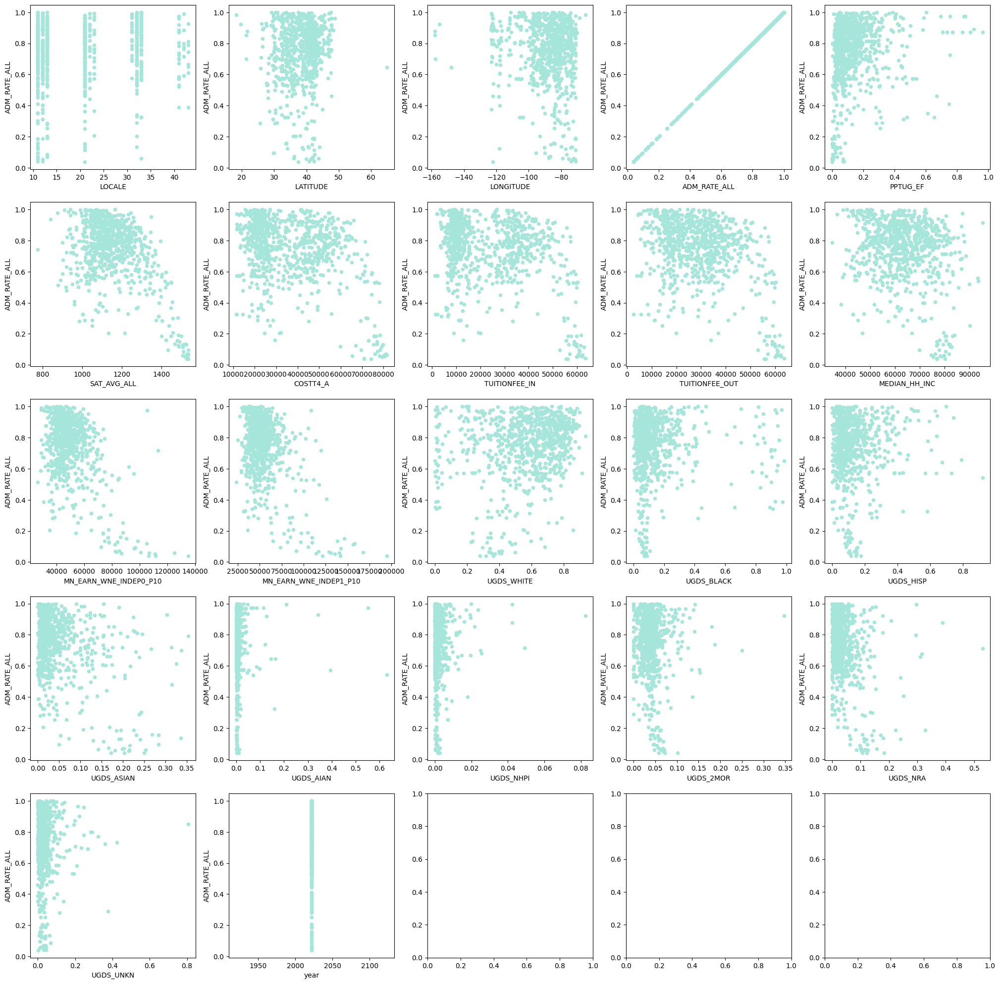

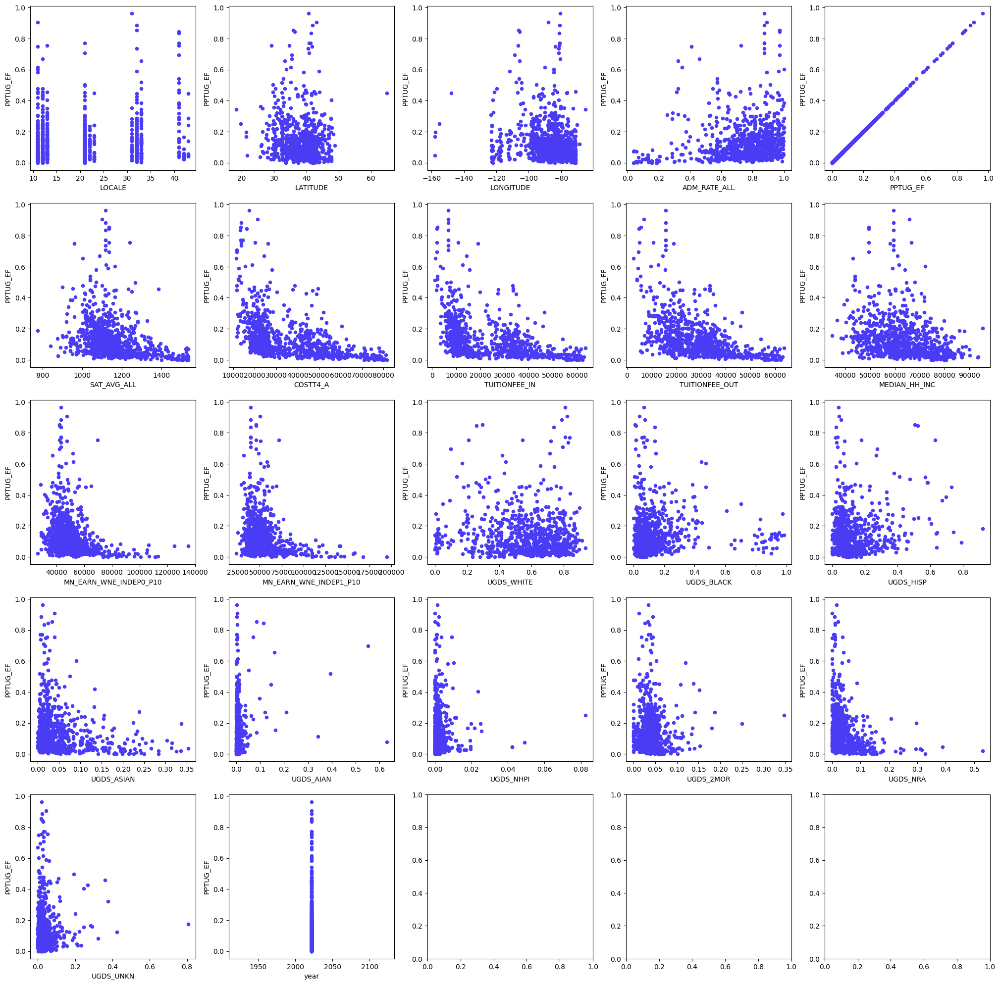

...

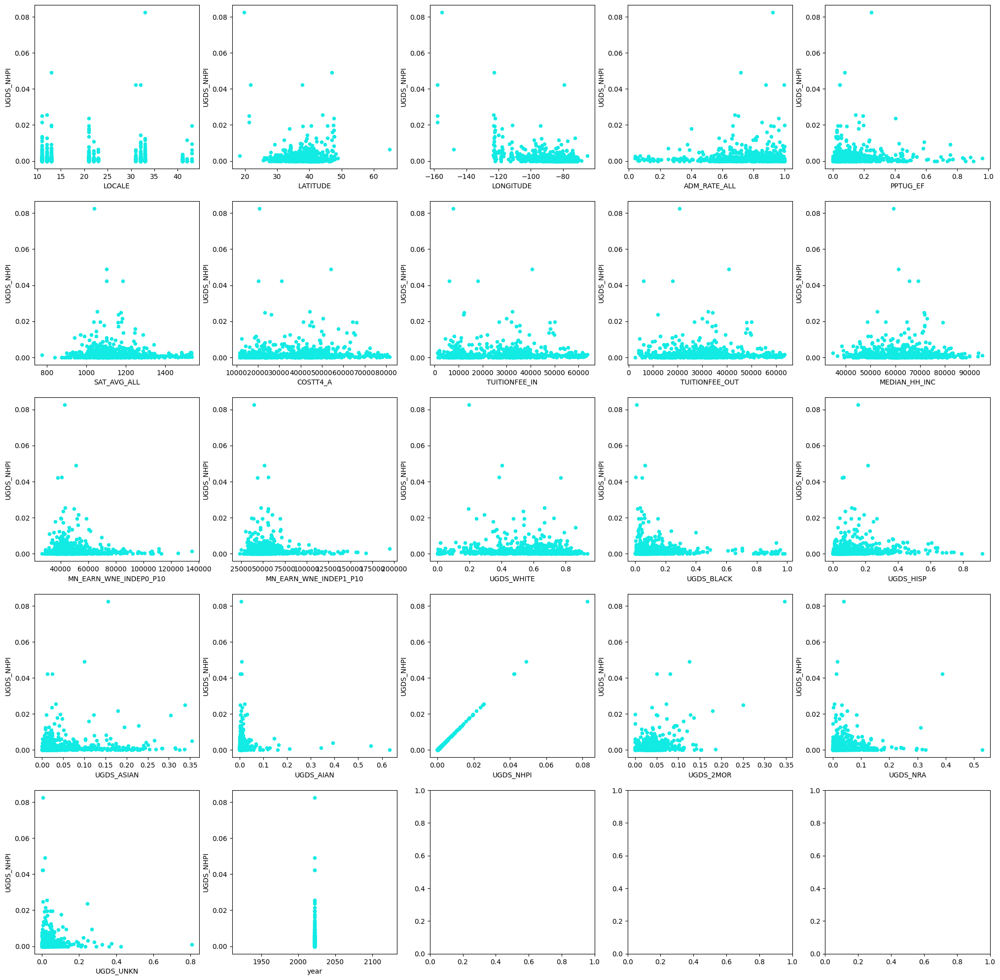

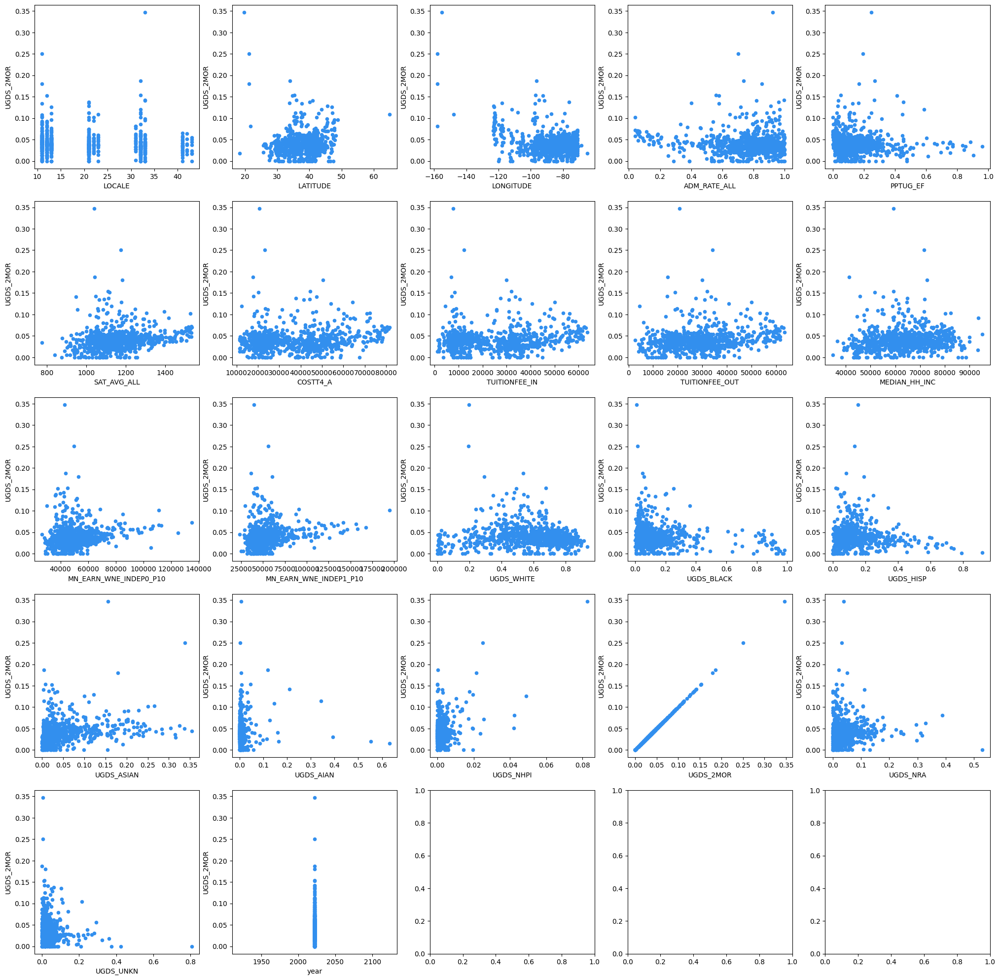

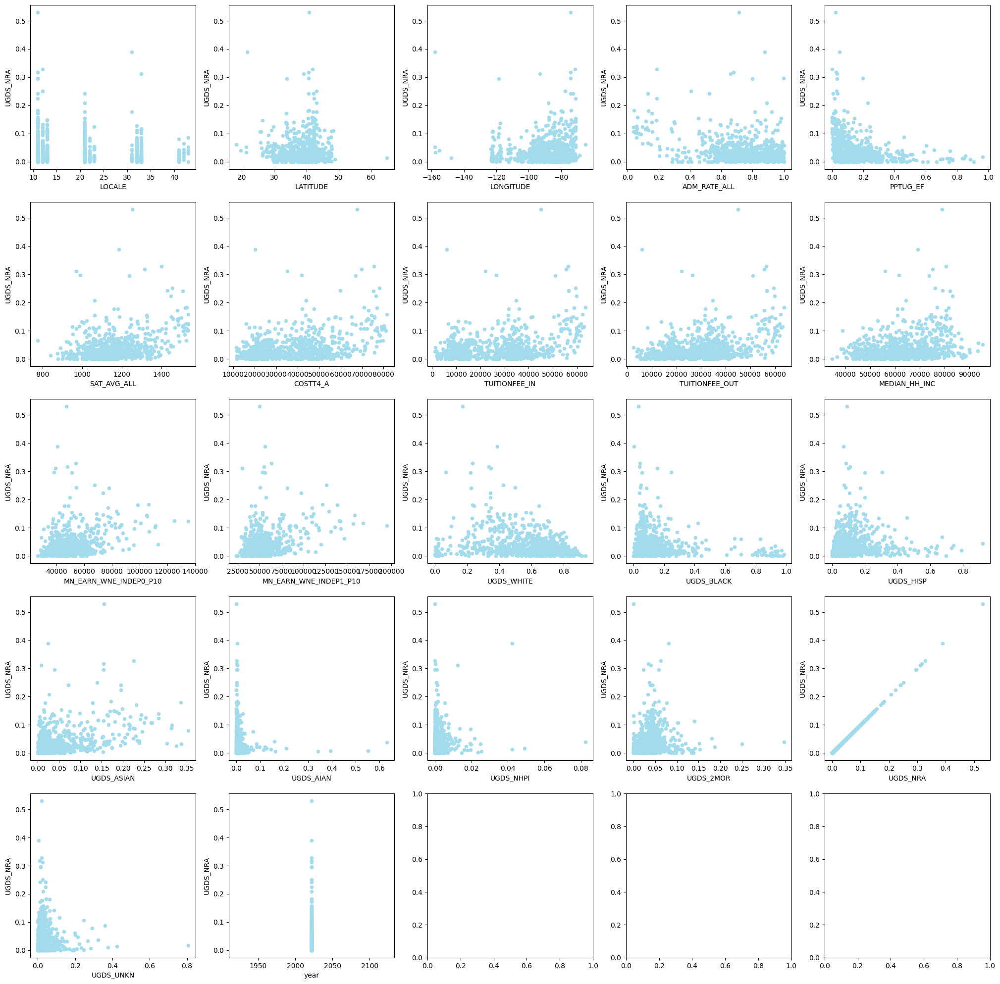

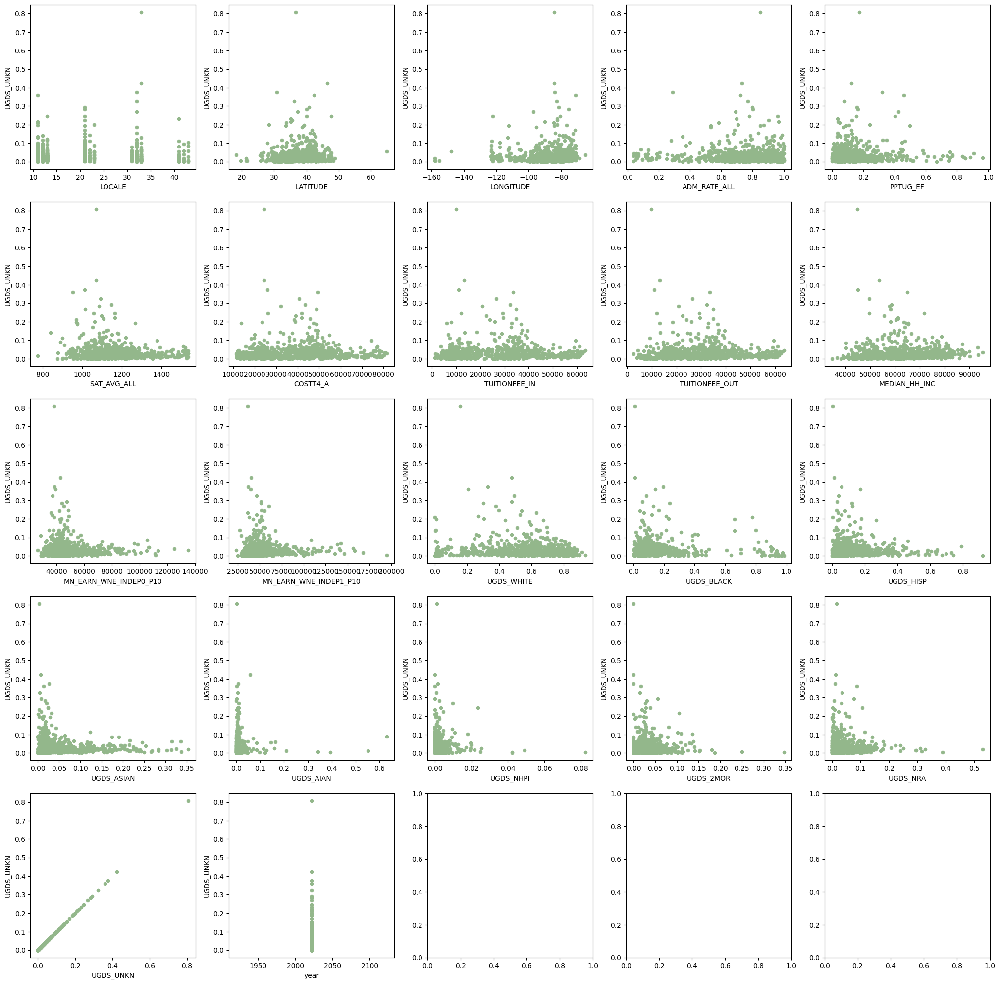

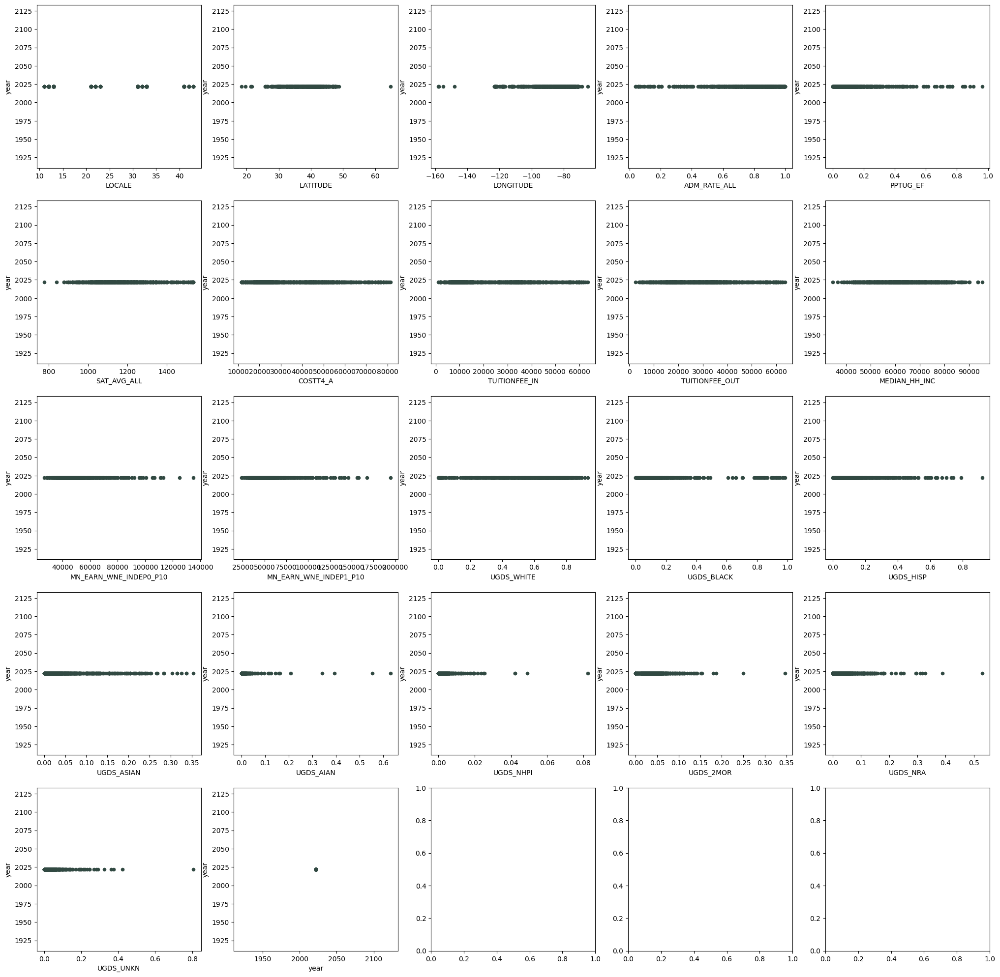

In [32]:
for param_name in num_cols.columns:
  color = np.random.choice(range(256), size=3)
  color=str(hex(color[0]))+str(hex(color[1]))[2:4]+str(hex(color[2]))[2:4]
  color='#'+color[2::]
  if len(color)<=6:
    print(color, end=' ')
    print(param_name)
    color=color+'a'
  fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(25, 25))
  for idx, feature in enumerate(num_cols.columns):
    num_cols.plot(feature, param_name, subplots=True, kind="scatter", ax=axes[idx // 5, idx % 5], color=color)

In [ ]:
#fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(25, 20))
#for idx, feature in enumerate(df2.columns):
#    df2.plot(feature, "UGDS_BLACK", subplots=True, kind="scatter", ax=axes[idx // 5, idx % 5])

# Это я просто балусь

In [ ]:
fig, axes = plt.subplots(nrows=8, ncols=4, figsize=(25, 20))
for idx, feature in enumerate(df2.columns):
  plt.xlabel="Porosity_(matrix_average_%)"
  plt.ylabel=feature
  plt.scatter(feature, idx)


In [ ]:
colors='red'
sizes=3
plt.scatter(num_cols['LOCALE'], num_cols['LATITUDE'], c=colors, s=sizes, alpha=0.7, cmap='viridis')
plt.title("Customized Scatter Plot")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")

# Display color intensity scale
plt.colorbar(label='Color Intensity')

# Show the plot
plt.show()

# И снова код из примера

In [ ]:
for col in num_cols.columns[3:]:
    print(f'Outliers for {col} column: {boxplot_stats(df2[col]).pop(0)["fliers"]}\n')

Outliers for ADM_RATE_ALL column: [0.12507215 0.05311177 0.11983785 0.31321617 0.28493313 0.15602282
 0.15959862 0.2883939  0.06478117 0.06971618 0.15066407 0.0963207
 0.19040807 0.18645253 0.04011352 0.18378874 0.29914248 0.1143022
 0.20509259 0.13001724 0.06171533 0.04130257 0.0868507  0.12961044
 0.05888981 0.20398589 0.28018018 0.30238926 0.25295508 0.135366
 0.05865228 0.28571429 0.25243753 0.05514516 0.186841   0.07142857
 0.09484159 0.28745252 0.13447002 0.20743783 0.03948009 0.31321617
 0.15602282]

Outliers for PPTUG_EF column: [0.4489 0.4139 0.4779 0.4036 0.3892 0.5885 0.3858 0.4368 0.446  0.4253
 0.4757 0.4497 0.4586 0.4286 0.4508 0.4782 0.6954 0.854  0.5401 0.514
 0.5189 0.7547 0.845  0.6689 0.4678 0.497  0.5816 0.8849 0.963  0.7082
 0.7712 0.7369 0.7707 0.8354 0.7481 0.4533 0.6137 0.5019 0.4299 0.3862
 0.4185 0.6023 0.6551 0.4468 0.7547 0.4552 0.4081 0.4559 0.4037 0.9063
 0.4399]

Outliers for SAT_AVG_ALL column: [ 776. 1484. 1526. 1488. 1480. 1535. 1529. 1490. 1485. 1534.

#Distibutions of num features

In [ ]:
df2.columns

Index(['INSTNM', 'CITY', 'STABBR', 'ZIP', 'REGION', 'PREDDEG', 'LOCALE',
       'LATITUDE', 'LONGITUDE', 'CCBASIC', 'CCUGPROF', 'CCSIZSET',
       'ADM_RATE_ALL', 'PPTUG_EF', 'SAT_AVG_ALL', 'COSTT4_A', 'CONTROL',
       'TUITIONFEE_IN', 'TUITIONFEE_OUT', 'MEDIAN_HH_INC',
       'MN_EARN_WNE_INDEP0_P10', 'MN_EARN_WNE_INDEP1_P10', 'UGDS_WHITE',
       'UGDS_BLACK', 'UGDS_HISP', 'UGDS_ASIAN', 'UGDS_AIAN', 'UGDS_NHPI',
       'UGDS_2MOR', 'UGDS_NRA', 'UGDS_UNKN', 'year'],
      dtype='object')

<Axes: xlabel='UGDS_NRA', ylabel='Density'>

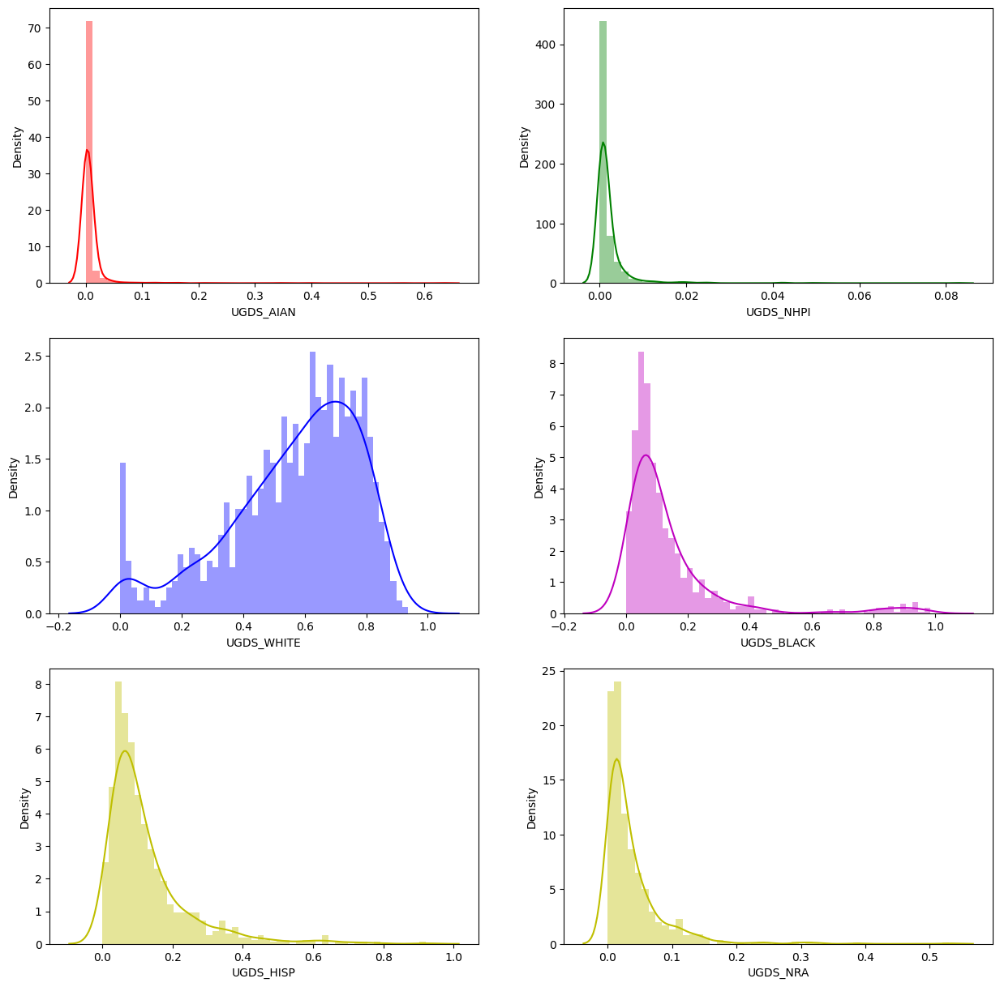

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
sns.distplot(df2['UGDS_AIAN'], bins=50, color='r', ax=axes[0, 0])
sns.distplot(df2['UGDS_NHPI'], bins=50, color='g', ax=axes[0, 1])
sns.distplot(df2['UGDS_WHITE'], bins=50, color='b', ax=axes[1, 0])
sns.distplot(df2['UGDS_BLACK'].dropna(), bins=50, color='m', ax=axes[1, 1])
sns.distplot(df2['UGDS_HISP'], bins=50, color='y', ax=axes[2, 0])
sns.distplot(df2['UGDS_NRA'], bins=50, color='y', ax=axes[2, 1])

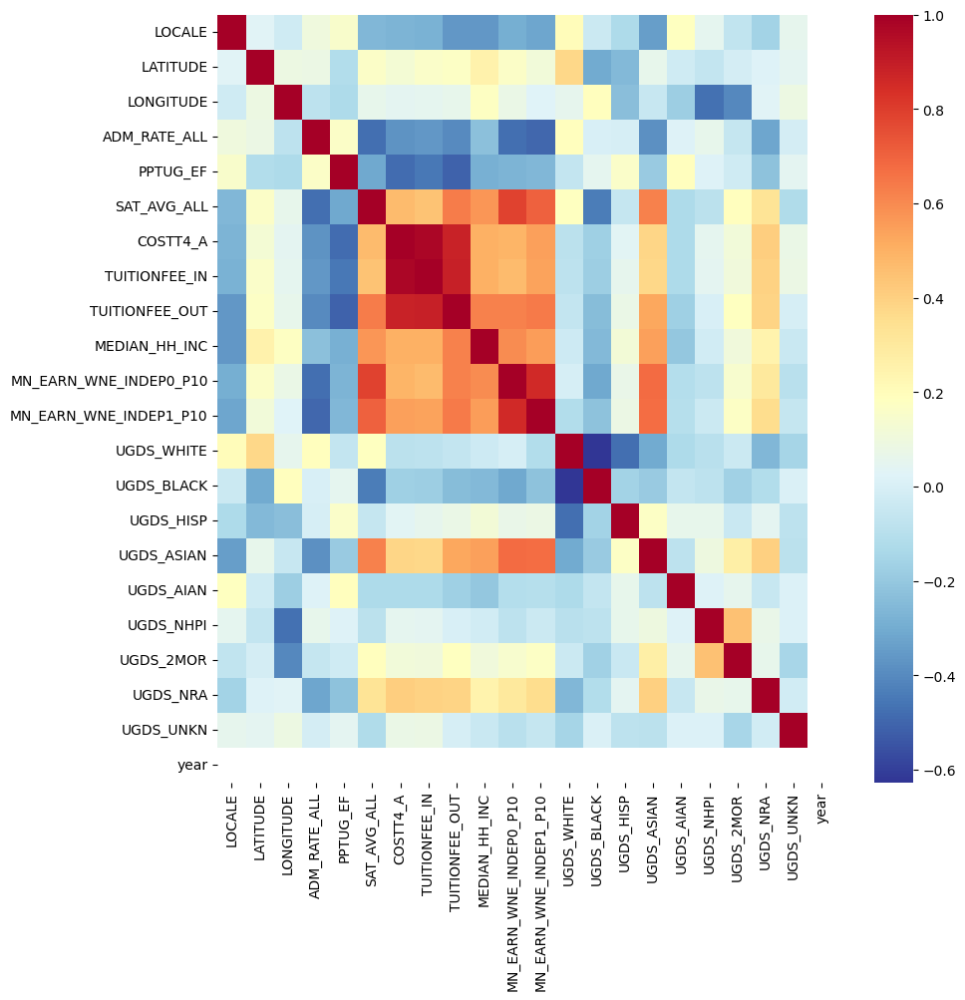

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(num_cols.corr(), cmap="RdYlBu_r");

#PCA(n_components=3)

In [ ]:
num_cols.head(3)

,LOCALE,LATITUDE,LONGITUDE,ADM_RATE_ALL,PPTUG_EF,SAT_AVG_ALL,COSTT4_A,TUITIONFEE_IN,TUITIONFEE_OUT,MEDIAN_HH_INC,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
UNITID,,,,,,,,,,,,,,,,,,,,,
100654,12.0,34.783368,-86.568502,0.716006,0.1116,954.0,21924.0,10024.0,18634.0,49720.22,...,0.0184,0.8978,0.0114,0.0014,0.0027,0.0010,0.0108,0.0086,0.0479,2022
100663,12.0,33.505697,-86.799345,0.885352,0.2197,1266.0,26248.0,8568.0,20400.0,55735.22,...,0.5297,0.2458,0.0669,0.0767,0.0021,0.0004,0.0483,0.0233,0.0068,2022
100706,12.0,34.724557,-86.640449,0.736724,0.1551,1300.0,24869.0,11488.0,23884.0,58688.62,...,0.7196,0.0871,0.0610,0.0357,0.0080,0.0012,0.0446,0.0166,0.0261,2022


In [ ]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(num_cols)
df_scaled[:5]

array([[-0.86458088, -0.74261126,  0.10633479, -0.1527723 , -0.20752109,
        -1.58617941, -0.84251631, -0.83309632, -0.79612711, -1.2434622 ,
        -1.151859  , -0.80804343, -2.57705467,  4.30342203, -0.9486187 ,
        -0.78279992, -0.16130767, -0.22120387, -1.12538294, -0.60170836,
         0.27792808,  0.        ],
       [-0.86458088, -1.00355762,  0.08906158,  0.70248207,  0.55980332,
         0.89096709, -0.58265755, -0.92506288, -0.65799811, -0.68771382,
        -0.47473998,  0.15530855, -0.16972157,  0.60799433, -0.4877222 ,
         0.49525039, -0.17740371, -0.34589947,  0.28410221, -0.29433161,
        -0.52522127,  0.        ],
       [-0.86458088, -0.75462258,  0.10095123, -0.04814107,  0.10125423,
         1.16091255, -0.6655311 , -0.74062444, -0.38549446, -0.41483812,
         0.15621184, -0.08552945,  0.72437691, -0.29149091, -0.53671841,
        -0.20063358, -0.01912599, -0.17963867,  0.14503301, -0.43442849,
        -0.14807328,  0.        ],
       [-0.86458088

In [ ]:
df_scaled.shape

(842, 22)

In [ ]:
model = PCA(n_components=3)
model.fit(df_scaled)
df_pca_3 = model.transform(df_scaled)

In [ ]:
df_pca_3

array([[-3.08988227,  2.37974112, -3.66643168],
       [-0.87158609,  0.50893447, -0.13399493],
       [-0.36092473, -0.53642833,  0.35873408],
       ...,
       [-2.61645819, -1.04469924,  0.77028157],
       [-2.58485201, -0.25328504,  0.51373854],
       [ 0.95542196, -0.95271376, -0.08069674]])

In [ ]:
def draw_3d(data):
    fig = plt.figure(figsize=(7, 7))
    ax = fig.add_subplot(111, projection='3d')

    for f in data:
        ax.scatter(f[0], f[1], f[2], c='b')
    plt.show()

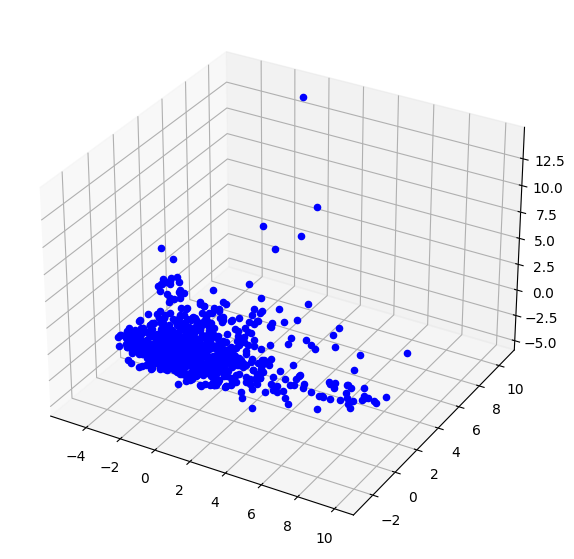

In [ ]:
draw_3d(df_pca_3)

#Class visualizations with PCA

In [ ]:
model = PCA(n_components=2)
model.fit(df_scaled)
pca_coords = model.transform(df_scaled)
pca_coords[:5]

array([[-3.08988334,  2.37979193],
       [-0.87158563,  0.50884822],
       [-0.36092542, -0.53638931],
       [-3.66502951,  2.57619725],
       [-0.43175691, -0.76148054]])

In [ ]:
df_to_draw = pd.DataFrame({
    'class': df_class,
    'pca1': pca_coords[:, 0],
    'pca2': pca_coords[:, 1],
})
colors = ['b', 'r', 'k', 'g', 'c', 'm', 'y', 'gold', 'darkorange', 'lime']

In [ ]:
df_class

UNITID
100654      9
100663    628
100706    629
100724      9
100751    598
         ... 
488679    261
490805    476
491288    766
492801    151
495767    597
Name: INSTNM, Length: 842, dtype: int64

In [ ]:
df_class.max()/10

83.7

In [ ]:
for i in range(10):
  df_class.mask(df_class<=i*80, i, inplace=True)
df_class.mask(df_class>=800, 10, inplace=True)

In [ ]:
df_class.max()

9

In [ ]:
df_class.mask(df_class<=80, 1, inplace=True)
df_class.mask((df_class>80)&(df_class<=160), 2, inplace=True)
df_class.mask((df_class>160)&(df_class<=240), 3, inplace=True)
df_class.mask((df_class>240)&(df_class<=320), 4, inplace=True)
df_class.mask((df_class>320)&(df_class<=400), 5, inplace=True)
df_class.mask((df_class>400)&(df_class<=480), 6, inplace=True)
df_class.mask((df_class>480)&(df_class<=560), 7, inplace=True)
df_class.mask((df_class>560)&(df_class<=640), 8, inplace=True)
df_class.mask((df_class>640)&(df_class<=720), 9, inplace=True)
df_class.mask(df_class>720, 10, inplace=True)
#df_class.max()

1

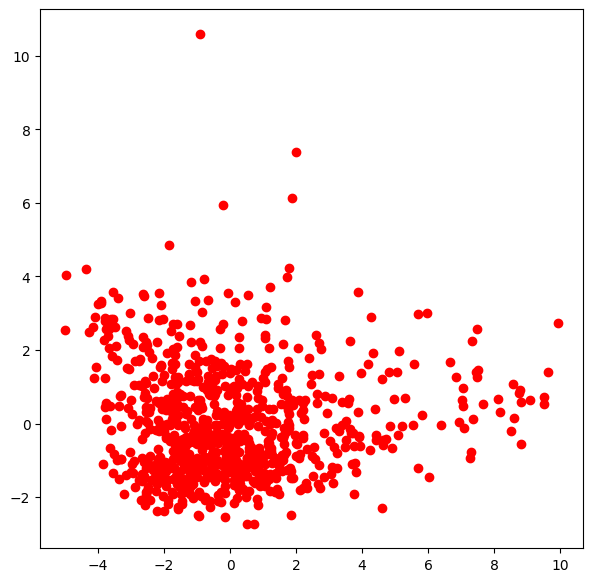

In [ ]:
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111)

for f in df_to_draw.iterrows():
    ax.scatter(f[1]['pca1'], f[1]['pca2'], c=colors[int(f[1]['class'])])

plt.show()

In [ ]:
model = PCA(n_components=3)
model.fit(df_scaled)
pca_coords = model.transform(df_scaled)
pca_coords[:5]

array([[-3.08988333,  2.37978854, -3.66669297],
       [-0.8715858 ,  0.50885466, -0.1340227 ],
       [-0.36092537, -0.53639009,  0.35855779],
       [-3.66502976,  2.57620089, -3.48865455],
       [-0.43175693, -0.76147989,  0.10033068]])

In [ ]:
df_to_draw = pd.DataFrame({
    'class': df_class,
    'pca1': pca_coords[:, 0],
    'pca2': pca_coords[:, 1],
    'pca3': pca_coords[:, 2],
})
colors = ['b', 'r', 'k', 'g', 'c', 'm', 'y', 'gold', 'darkorange', 'lime']

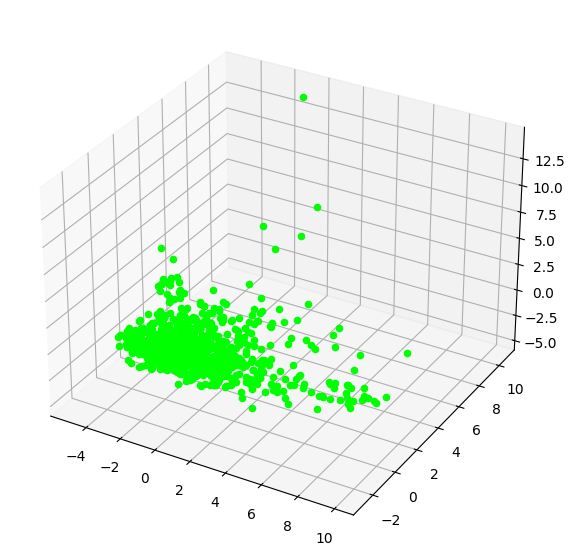

In [ ]:
fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111, projection='3d')

for f in df_to_draw.iterrows():
    ax.scatter(f[1]['pca1'], f[1]['pca2'], f[1]['pca3'], c=colors[int(f[1]['class'])])
plt.show()

# Sci-Kit подготовка

Интересными параметрами мне показались следующие:


| Название столбца | Значение | По-русски |
| ----------------| :----------------| :------------------------|
| ADM_RATE_ALL  | Admission rate| Коэффициент приема |
| PPTUG_EF  | Share of undergraduate, degree-/certificate-seeking <br>students who are part-time| Доля студентов бакалавриата, <br> соискателей степени <br>  которые работают неполный рабочий день |
| SAT_AVG_ALL  | Average SAT score| средний балл |
| COSTT4_A  | The average annual total cost of attendance (CostT4_A, CostT4_P), <br> including tuition and fees, books and supplies, and living expenses,<br> minus the average grant/scholarship aid. It is calculated for all full-time, <br>first-time, degree/certificate-seeking undergraduates who receive <br>Title IV aid| Среднегодовая общая стоимость посещения |
| CONTROL |  Control of institution (IPEDS)| КОНТРОЛЬ |
| TUITIONFEE_IN  | In-state tuition and fees| Плата за обучение в штате и сборы за обучение |
| TUITIONFEE_OUT  | Out-state tuition and fees| Плата за обучение за пределами штата и сборы за обучение за пределами штата |
| MEDIAN_HH_INC MN_EARN_WNE_INDEP0_P10  | Median household income| Средний доход домохозяйства |
| MN_EARN_WNE_INDEP1_P10  | Mean household income| Средний доход домохозяйства |
| UGDS_WHITE  | Total share of enrollment of undergraduate degree-seeking <br>students who are white|  Общая доля белых студентов |
| UGDS_BLACK  | Total share of enrollment of undergraduate degree-seeking <br>students who are black| Общая доля чернокожих студентов |
| UGDS_HISP  | Total share of enrollment of undergraduate degree-seeking <br>students who are Hispanic| Общая доля испаноязычных|
| UGDS_ASIAN  | Total share of enrollment of undergraduate degree-seeking <br>students who are Asian| Общая доля азиатов |
| UGDS_AIAN  | Total share of enrollment of undergraduate degree-seeking <br>students who are American Indian/Alaska Native| Общая доля туземцев |
| UGDS_NHPI  | Total share of enrollment of undergraduate degree-seeking <br>students who are Native Hawaiian/Pacific Islander| Общая доля гаитян|
| UGDS_2MOR  | Total share of enrollment of undergraduate degree-seeking <br>students who are two or more races|  Общая доля 2 и более рас |
| UGDS_NRA  | Total share of enrollment of undergraduate degree-seeking <br>students who are non-resident aliens| Общая доля иностранцев |
| UGDS_UNKN  | Total share of enrollment of undergraduate degree-seeking <br>students whose race is unknown| Общая доля с неизвестным происхождением|



In [33]:
df2.head(2)

,INSTNM,CITY,STABBR,ZIP,REGION,PREDDEG,LOCALE,LATITUDE,LONGITUDE,CCBASIC,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
UNITID,,,,,,,,,,,,,,,,,,,,,
100654,4,402,1,341,7,1,12.0,34.783368,-86.568502,15,...,0.0184,0.8978,0.0114,0.0014,0.0027,0.0010,0.0108,0.0086,0.0479,2022
100663,628,51,1,338,7,1,12.0,33.505697,-86.799345,13,...,0.5297,0.2458,0.0669,0.0767,0.0021,0.0004,0.0483,0.0233,0.0068,2022


In [42]:
df3=df2
df3=df3.drop('INSTNM', axis=1)


In [43]:
df3=df3.drop('CITY', axis=1).drop('STABBR', axis=1).drop('ZIP', axis=1).drop('REGION', axis=1).drop('LOCALE', axis=1)

In [45]:
df3=df3.drop('PREDDEG', axis=1).drop('CCBASIC', axis=1).drop('CCUGPROF',axis=1).drop('CCSIZSET', axis=1)

In [46]:
df3.head()

,LATITUDE,LONGITUDE,ADM_RATE_ALL,PPTUG_EF,SAT_AVG_ALL,COSTT4_A,CONTROL,TUITIONFEE_IN,TUITIONFEE_OUT,MEDIAN_HH_INC,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
UNITID,,,,,,,,,,,,,,,,,,,,,
100654,34.783368,-86.568502,0.716006,0.1116,954.0,21924.0,2,10024.0,18634.0,49720.22,...,0.0184,0.8978,0.0114,0.0014,0.0027,0.0010,0.0108,0.0086,0.0479,2022
100663,33.505697,-86.799345,0.885352,0.2197,1266.0,26248.0,2,8568.0,20400.0,55735.22,...,0.5297,0.2458,0.0669,0.0767,0.0021,0.0004,0.0483,0.0233,0.0068,2022
100706,34.724557,-86.640449,0.736724,0.1551,1300.0,24869.0,2,11488.0,23884.0,58688.62,...,0.7196,0.0871,0.0610,0.0357,0.0080,0.0012,0.0446,0.0166,0.0261,2022
100724,32.364317,-86.295677,0.979913,0.1259,955.0,21938.0,2,11068.0,19396.0,46065.20,...,0.0152,0.9259,0.0129,0.0020,0.0017,0.0014,0.0132,0.0166,0.0112,2022
100751,33.211875,-87.545978,0.789043,0.0863,1244.0,31050.0,2,11620.0,31090.0,57928.41,...,0.7676,0.1050,0.0549,0.0137,0.0037,0.0008,0.0356,0.0127,0.0060,2022


In [48]:
df3.shape

(842, 22)

Сохраняем для дальнейших манипуляций

In [4]:
df3.to_csv('data3.csv', sep=',')

NameError: name 'df3' is not defined

#SciKit Из урока

In [5]:
df = pd.read_csv("data3.csv", index_col="UNITID")
df.head(5)


,LATITUDE,LONGITUDE,ADM_RATE_ALL,PPTUG_EF,SAT_AVG_ALL,COSTT4_A,CONTROL,TUITIONFEE_IN,TUITIONFEE_OUT,MEDIAN_HH_INC,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
UNITID,,,,,,,,,,,,,,,,,,,,,
100654,34.783368,-86.568502,0.716006,0.1116,954.0,21924.0,2,10024.0,18634.0,49720.22,...,0.0184,0.8978,0.0114,0.0014,0.0027,0.0010,0.0108,0.0086,0.0479,2022
100663,33.505697,-86.799345,0.885352,0.2197,1266.0,26248.0,2,8568.0,20400.0,55735.22,...,0.5297,0.2458,0.0669,0.0767,0.0021,0.0004,0.0483,0.0233,0.0068,2022
100706,34.724557,-86.640449,0.736724,0.1551,1300.0,24869.0,2,11488.0,23884.0,58688.62,...,0.7196,0.0871,0.0610,0.0357,0.0080,0.0012,0.0446,0.0166,0.0261,2022
100724,32.364317,-86.295677,0.979913,0.1259,955.0,21938.0,2,11068.0,19396.0,46065.20,...,0.0152,0.9259,0.0129,0.0020,0.0017,0.0014,0.0132,0.0166,0.0112,2022
100751,33.211875,-87.545978,0.789043,0.0863,1244.0,31050.0,2,11620.0,31090.0,57928.41,...,0.7676,0.1050,0.0549,0.0137,0.0037,0.0008,0.0356,0.0127,0.0060,2022


In [56]:
!pip install -U scikit-learn  # Restart environment after

In [1]:
import pandas as pd
import numpy as np

from sklearn.datasets import load_diabetes, load_breast_cancer, make_classification, load_iris
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import mean_squared_error, classification_report
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import DecisionBoundaryDisplay

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns

import warnings
warnings.simplefilter('ignore')

## Линейная регрессия

In [2]:
#Из примера
X, y =  load_diabetes(return_X_y=True, as_frame=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=2023, test_size=0.25)
X_train.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
422,-0.078165,0.050680,0.077863,0.052858,0.078236,0.064447,0.026550,-0.002592,0.040673,-0.009362
409,-0.052738,0.050680,-0.011595,0.056301,0.056221,0.072902,-0.039719,0.071210,0.030564,-0.005220
55,-0.041840,-0.044642,-0.049318,-0.036656,-0.007073,-0.022608,0.085456,-0.039493,-0.066490,0.007207
157,-0.001882,0.050680,-0.033151,-0.018306,0.031454,0.042840,-0.013948,0.019917,0.010227,0.027917
70,-0.001882,-0.044642,-0.069797,-0.012556,-0.000193,-0.009143,0.070730,-0.039493,-0.062917,0.040343


In [14]:
#Получаем функциональные переменные X и Y

X= df.drop('COSTT4_A', axis=1)
y=df['COSTT4_A']

In [15]:
#Используем train test split
X_train, X_test, y_train, y_test = train_test_split(
  X,y , random_state=104,test_size=0.25, shuffle=True)

In [16]:
X_train.head()

,LATITUDE,LONGITUDE,ADM_RATE_ALL,PPTUG_EF,SAT_AVG_ALL,CONTROL,TUITIONFEE_IN,TUITIONFEE_OUT,MEDIAN_HH_INC,MN_EARN_WNE_INDEP0_P10,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
UNITID,,,,,,,,,,,,,,,,,,,,,
491288,43.076848,-87.880488,0.889584,0.9063,1100.0,2,6750.0,6750.0,65921.14,47600.0,...,0.8206,0.0397,0.0413,0.0397,0.0032,0.0000,0.0127,0.0000,0.0429,2022
127060,39.678005,-104.963259,0.636292,0.0589,1324.0,1,54819.0,54819.0,78120.26,62600.0,...,0.6860,0.0250,0.1320,0.0376,0.0045,0.0016,0.0587,0.0359,0.0187,2022
180081,45.938145,-112.509365,0.898369,0.1474,1172.0,2,3590.0,9390.0,44236.75,59400.0,...,0.8333,0.0128,0.0577,0.0064,0.0224,0.0000,0.0000,0.0000,0.0673,2022
193292,40.685941,-73.626183,0.793265,0.1844,1235.0,1,34310.0,34310.0,87964.15,60400.0,...,0.5431,0.0970,0.2235,0.0862,0.0028,0.0022,0.0212,0.0062,0.0179,2022
154350,41.365503,-93.563471,0.908271,0.0805,1166.0,1,44030.0,44030.0,60274.33,51500.0,...,0.7875,0.0351,0.0831,0.0137,0.0009,0.0009,0.0437,0.0146,0.0206,2022


In [17]:
X_train.shape

(631, 21)

In [18]:
X_test.head()

,LATITUDE,LONGITUDE,ADM_RATE_ALL,PPTUG_EF,SAT_AVG_ALL,CONTROL,TUITIONFEE_IN,TUITIONFEE_OUT,MEDIAN_HH_INC,MN_EARN_WNE_INDEP0_P10,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
UNITID,,,,,,,,,,,,,,,,,,,,,
228802,32.315772,-95.254337,0.938776,0.2996,1136.0,2,9596.0,25142.0,53622.93,50800.0,...,0.5218,0.1052,0.2476,0.0490,0.0044,0.0003,0.0379,0.0280,0.0058,2022
207500,35.209407,-97.444211,0.852292,0.1240,1249.0,2,12012.0,27816.0,59522.71,60400.0,...,0.5898,0.0468,0.1253,0.0694,0.0317,0.0010,0.0942,0.0300,0.0118,2022
178615,40.188267,-92.581658,0.609882,0.0398,1278.0,2,8689.0,16410.0,64318.95,50700.0,...,0.7860,0.0292,0.0341,0.0268,0.0015,0.0006,0.0353,0.0790,0.0075,2022
243780,40.428206,-86.914435,0.688101,0.0474,1328.0,2,9992.0,28794.0,68624.95,61900.0,...,0.6276,0.0248,0.0625,0.1161,0.0010,0.0006,0.0432,0.1106,0.0135,2022
174783,45.553227,-94.152657,0.943236,0.2187,1085.0,2,9170.0,18010.0,66422.48,48700.0,...,0.6378,0.1069,0.0491,0.0570,0.0021,0.0003,0.0320,0.1113,0.0035,2022


In [19]:
X_test.shape

(211, 21)

In [20]:
#Потестим линейную регрессию
lr = LinearRegression()
lr.fit(X_train, y_train)
y_preds_lr = lr.predict(X_test)

In [21]:
print(f'RMSE: {mean_squared_error(y_test, y_preds_lr, squared=False)}')

RMSE: 3726.4610465857077


In [22]:
X_train.describe()

,LATITUDE,LONGITUDE,ADM_RATE_ALL,PPTUG_EF,SAT_AVG_ALL,CONTROL,TUITIONFEE_IN,TUITIONFEE_OUT,MEDIAN_HH_INC,MN_EARN_WNE_INDEP0_P10,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
count,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,...,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.000000,631.0
mean,38.278020,-87.712059,0.751915,0.146917,1146.793978,1.483360,22877.652932,28625.697306,63002.934628,49381.774960,...,0.555262,0.148888,0.129403,0.045724,0.007495,0.002099,0.040484,0.036241,0.034404,2022.0
std,5.008801,13.186275,0.191666,0.146182,121.575695,0.503283,15631.371869,12660.444650,10950.283996,12472.800911,...,0.217611,0.189726,0.126664,0.055535,0.026406,0.004811,0.026797,0.046657,0.053250,0.0
min,18.344193,-157.818979,0.040114,0.000000,840.000000,0.000000,1176.000000,2644.000000,34674.560000,26700.000000,...,0.000600,0.003800,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2022.0
25%,34.723906,-93.594854,0.667191,0.052350,1065.500000,1.000000,9138.500000,18514.000000,55679.465000,42100.000000,...,0.431650,0.048500,0.051850,0.012200,0.001300,0.000400,0.027200,0.010700,0.009950,2022.0
50%,39.508546,-84.474650,0.791556,0.108900,1122.000000,1.000000,15888.000000,27932.000000,62696.440000,46900.000000,...,0.601100,0.085600,0.088200,0.024200,0.002700,0.001000,0.037400,0.020600,0.021800,2022.0
75%,41.740842,-78.867351,0.889253,0.181850,1211.000000,2.000000,34390.000000,35825.000000,70655.075000,53350.000000,...,0.720250,0.162250,0.156250,0.055500,0.005150,0.001800,0.047800,0.045400,0.037400,2022.0
max,64.857560,-64.972866,1.000000,0.963000,1534.000000,2.000000,63530.000000,63530.000000,95275.150000,135000.000000,...,0.915000,0.984300,0.920300,0.354200,0.393900,0.082500,0.347100,0.529700,0.807000,2022.0


In [ ]:
#мультиколлинеарность

In [23]:
corrs = df.corr()
upper_tri = corrs.where(np.triu(np.ones(corrs.shape), k=1).astype(np.bool))
upper_tri

,LATITUDE,LONGITUDE,ADM_RATE_ALL,PPTUG_EF,SAT_AVG_ALL,COSTT4_A,CONTROL,TUITIONFEE_IN,TUITIONFEE_OUT,MEDIAN_HH_INC,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
LATITUDE,NaN,0.089989,0.082871,-0.116465,0.163287,0.128397,-0.053075,0.158827,0.169436,0.251678,...,0.376226,-0.306081,-0.255850,0.062659,-0.028720,-0.064622,-0.013868,0.015616,0.043224,NaN
LONGITUDE,NaN,NaN,-0.084417,-0.127030,0.061247,0.041835,-0.002437,0.048435,0.062579,0.179808,...,0.057089,0.187830,-0.233333,-0.053620,-0.177956,-0.474315,-0.410493,0.030395,0.085568,NaN
ADM_RATE_ALL,NaN,NaN,NaN,0.165206,-0.476410,-0.377638,0.220597,-0.362498,-0.400049,-0.226922,...,0.191199,-0.002387,-0.010233,-0.381748,0.016002,0.064809,-0.060535,-0.316232,-0.012450,NaN
PPTUG_EF,NaN,NaN,NaN,NaN,-0.310283,-0.485172,0.292526,-0.453289,-0.509083,-0.288375,...,-0.066308,0.046739,0.159793,-0.191069,0.188276,0.015793,-0.028774,-0.224545,0.044260,NaN
SAT_AVG_ALL,NaN,NaN,NaN,NaN,NaN,0.467914,-0.083660,0.443632,0.632535,0.570881,...,0.180153,-0.437915,-0.057181,0.620144,-0.128263,-0.088105,0.188648,0.332421,-0.124402,NaN
COSTT4_A,NaN,NaN,NaN,NaN,NaN,NaN,-0.780171,0.975508,0.883205,0.500748,...,-0.087369,-0.174102,0.039258,0.382795,-0.127563,0.047764,0.114339,0.408405,0.077041,NaN
CONTROL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.807322,-0.546230,-0.236331,...,0.094214,0.059568,-0.020181,-0.089940,0.071034,-0.128843,0.010632,-0.299695,-0.210378,NaN
TUITIONFEE_IN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.890397,0.498974,...,-0.086290,-0.181539,0.059281,0.376991,-0.129979,0.046187,0.106677,0.391940,0.079040,NaN
TUITIONFEE_OUT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.624944,...,-0.064224,-0.242405,0.072603,0.527447,-0.172935,-0.001364,0.185366,0.385563,-0.006451,NaN
MEDIAN_HH_INC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.031489,-0.255139,0.122049,0.548737,-0.203626,-0.021930,0.109371,0.243797,-0.042991,NaN


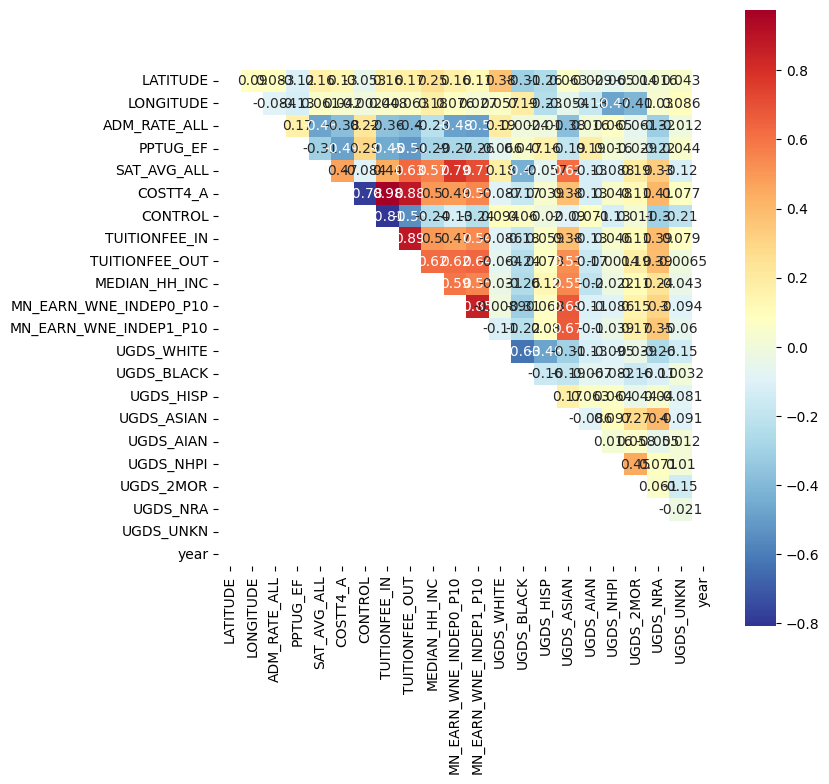

In [24]:
plt.figure(figsize=(8, 8))
sns.heatmap(upper_tri, cmap="RdYlBu_r", square=True, annot=True);

In [25]:
cols_to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
cols_to_drop

['TUITIONFEE_IN']

In [27]:
cutted_data = df.drop(columns=cols_to_drop)
cutted_data.head()

,LATITUDE,LONGITUDE,ADM_RATE_ALL,PPTUG_EF,SAT_AVG_ALL,COSTT4_A,CONTROL,TUITIONFEE_OUT,MEDIAN_HH_INC,MN_EARN_WNE_INDEP0_P10,...,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,year
UNITID,,,,,,,,,,,,,,,,,,,,,
100654,34.783368,-86.568502,0.716006,0.1116,954.0,21924.0,2,18634.0,49720.22,35000.0,...,0.0184,0.8978,0.0114,0.0014,0.0027,0.0010,0.0108,0.0086,0.0479,2022
100663,33.505697,-86.799345,0.885352,0.2197,1266.0,26248.0,2,20400.0,55735.22,43800.0,...,0.5297,0.2458,0.0669,0.0767,0.0021,0.0004,0.0483,0.0233,0.0068,2022
100706,34.724557,-86.640449,0.736724,0.1551,1300.0,24869.0,2,23884.0,58688.62,52000.0,...,0.7196,0.0871,0.0610,0.0357,0.0080,0.0012,0.0446,0.0166,0.0261,2022
100724,32.364317,-86.295677,0.979913,0.1259,955.0,21938.0,2,19396.0,46065.20,30400.0,...,0.0152,0.9259,0.0129,0.0020,0.0017,0.0014,0.0132,0.0166,0.0112,2022
100751,33.211875,-87.545978,0.789043,0.0863,1244.0,31050.0,2,31090.0,57928.41,52400.0,...,0.7676,0.1050,0.0549,0.0137,0.0037,0.0008,0.0356,0.0127,0.0060,2022


In [28]:
#Снова разбиваем
X_train, X_test, y_train, y_test = train_test_split(
    cutted_data.drop(columns='COSTT4_A'),
    cutted_data['COSTT4_A'],
    random_state=2023,
    test_size=0.3
)

In [29]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_preds_lr = lr.predict(X_test)

In [30]:
print(f'RMSE: {mean_squared_error(y_test, y_preds_lr, squared=False)}')

RMSE: 5087.374909932357


Ну, в принцмпе разница между 5000 и 3000 есть

#Масштабирование

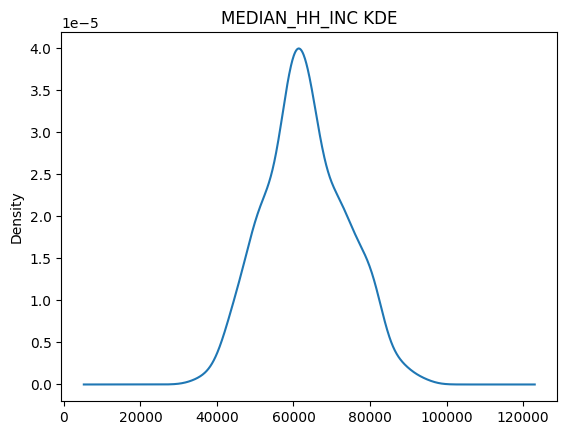

In [32]:
X_train['MEDIAN_HH_INC'].plot.kde(title='MEDIAN_HH_INC KDE');

In [33]:
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(
    scaler.fit_transform(X_train),
    columns=X_train.columns
)
X_test_scaled = pd.DataFrame(

    scaler.transform(X_test),
    columns=X_test.columns
)

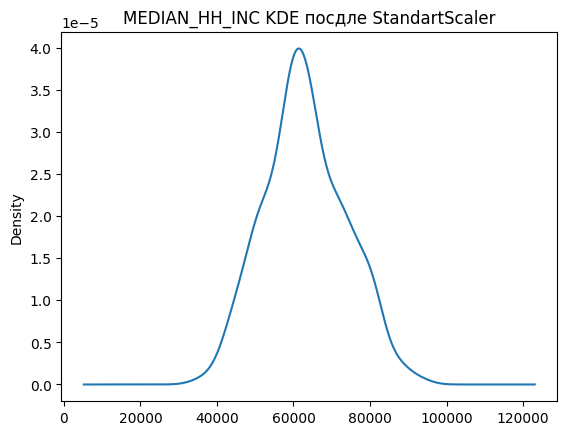

In [36]:
X_train['MEDIAN_HH_INC'].plot.kde(title='MEDIAN_HH_INC KDE посдле StandartScaler');

На словах инструмент правильный, но графики неочевидны

In [37]:
lr = LinearRegression()
lr.fit(X_train_scaled, y_train)
y_preds_lr = lr.predict(X_test_scaled)

In [38]:
print(f'RMSE: {mean_squared_error(y_test, y_preds_lr, squared=False)}')

RMSE: 5087.374909932427


#Интерпретация

In [39]:
#поиграемся весами
def plotCoefficients(model, columns):
    coefs = pd.DataFrame(model.coef_, columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)

    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed')

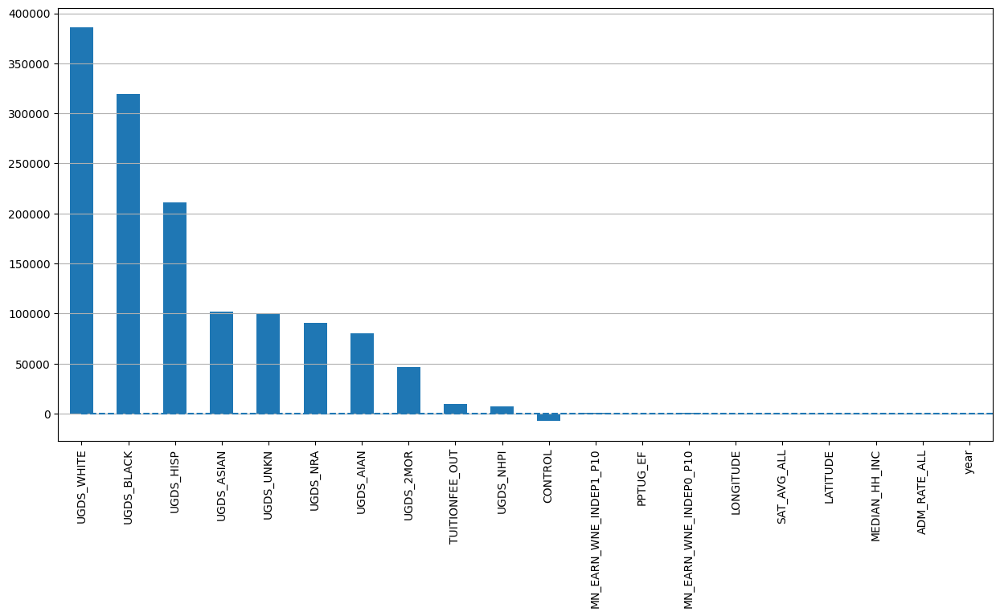

In [40]:
plotCoefficients(lr, X_train_scaled.columns)

#Линейная регрессия с регуляризацией

поборемся с мультиколлинеарностью и переобучением

In [41]:
X_train, X_test, y_train, y_test = train_test_split(
    df.drop(columns='COSTT4_A'),
    df['COSTT4_A'],
    random_state=2023,
    test_size=0.3
)

In [42]:
ridge = Ridge(alpha=1)
ridge.fit(X_train, y_train)
y_preds = ridge.predict(X_test)

print(f'RMSE Ridge: {mean_squared_error(y_test, y_preds, squared=False)}')

RMSE Ridge: 3728.575695791103


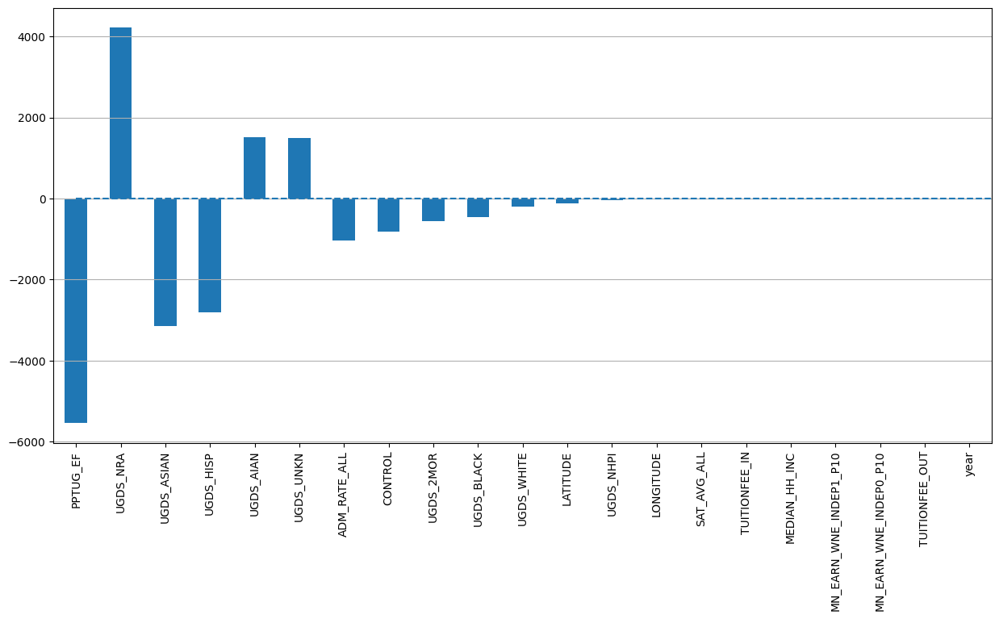

In [43]:
plotCoefficients(ridge, X_train.columns)

In [44]:
lasso = Lasso(alpha=1)
lasso.fit(X_train, y_train)
y_preds = lasso.predict(X_test)

print(f'RMSE Lasso: {mean_squared_error(y_test, y_preds, squared=False)}')

RMSE Lasso: 3726.5397406654433


In [ ]:
# получилось чуть меньше

#Логистическая регрессия

In [ ]:
# потестим

In [51]:
X_train, X_test, y_train, y_test = train_test_split(
    df.drop(columns='COSTT4_A'),
    df['COSTT4_A'],
    random_state=2023,
    test_size=0.3
)

In [52]:
scaler = StandardScaler()

X_train_scaled = pd.DataFrame(
    scaler.fit_transform(X_train),
    columns=X_train.columns
)
X_test_scaled = pd.DataFrame(
    scaler.transform(X_test),
    columns=X_test.columns
)

In [53]:
logreg = LogisticRegression()
logreg.fit(X_train_scaled, y_train)
y_preds_logreg = logreg.predict(X_test_scaled)
print(classification_report(y_test, y_preds_logreg))

              precision    recall  f1-score   support

     11603.0       0.00      0.00      0.00         0
     11654.0       0.00      0.00      0.00         1
     11659.0       0.00      0.00      0.00         1
     11801.0       0.00      0.00      0.00         0
     12036.0       0.00      0.00      0.00         1
     12622.0       0.00      0.00      0.00         1
     13103.0       0.00      0.00      0.00         1
     13200.0       0.00      0.00      0.00         0
     13466.0       0.00      0.00      0.00         1
     13729.0       0.00      0.00      0.00         0
     13732.0       0.00      0.00      0.00         1
     14319.0       0.00      0.00      0.00         0
     14332.0       0.00      0.00      0.00         0
     14346.0       0.00      0.00      0.00         0
     14397.0       0.00      0.00      0.00         1
     14898.0       0.00      0.00      0.00         0
     15347.0       0.00      0.00      0.00         1
     15702.0       0.00    

получилась полная засада, надо разбираться

# Многоклассовый случай

In [54]:
X, y = make_classification(n_samples=1000, n_features=10, n_informative=5, n_redundant=5, n_classes=4, random_state=2023)
model = LogisticRegression(multi_class='ovr')
model.fit(X, y)
y_preds_ovr = model.predict(X)
print(classification_report(y, y_preds_ovr))
# что-то не осознал

              precision    recall  f1-score   support

           0       0.67      0.58      0.62       251
           1       0.65      0.71      0.68       251
           2       0.71      0.76      0.73       250
           3       0.65      0.64      0.65       248

    accuracy                           0.67      1000
   macro avg       0.67      0.67      0.67      1000
weighted avg       0.67      0.67      0.67      1000



#к ближайших

In [55]:
X_train, X_test, y_train, y_test = train_test_split(
    df.drop(columns='COSTT4_A'),
    df['COSTT4_A'],
    random_state=2023,
    test_size=0.3
)

In [56]:
knn = KNeighborsClassifier(n_neighbors=5, weights='distance')
knn.fit(X_train, y_train)
y_preds_knn = knn.predict(X_test)
print(classification_report(y_test, y_preds_knn))

              precision    recall  f1-score   support

     11506.0       0.00      0.00      0.00         0
     11577.0       0.00      0.00      0.00         0
     11603.0       0.00      0.00      0.00         0
     11654.0       0.00      0.00      0.00         1
     11659.0       0.00      0.00      0.00         1
     12036.0       0.00      0.00      0.00         1
     12269.0       0.00      0.00      0.00         0
     12410.0       0.00      0.00      0.00         0
     12622.0       0.00      0.00      0.00         1
     13103.0       0.00      0.00      0.00         1
     13200.0       0.00      0.00      0.00         0
     13317.0       0.00      0.00      0.00         0
     13466.0       0.00      0.00      0.00         1
     13562.0       0.00      0.00      0.00         0
     13729.0       0.00      0.00      0.00         0
     13732.0       0.00      0.00      0.00         1
     14397.0       0.00      0.00      0.00         1
     15126.0       0.00    

Надо подбирать другие компоненты которые могут зависеть :(